In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import cv2
import re
import tensorflow as tf
from threading import Thread
import time
from tqdm import tqdm
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import init_notebook_mode
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.applications import VGG16, ResNet50, DenseNet201, Xception
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import scipy
import sklearn
from sklearn.model_selection import train_test_split

## Data

In [2]:
#replace the path of the folder where the images are stored
DATASET_PATH = "/Users/ankitkothari/Library/Mobile Documents/com~apple~CloudDocs/Documents/gdrivre/UMD/MSML640_CV/product_eembeddings_project/"
print(os.listdir(DATASET_PATH))

['flat_features.npy', '.DS_Store', 'images.csv', 'output_images', 'comparing_without_faces.png', 'cv_with_faces.png', 'cv_without_faces.png', 'img_small_no_faces_cropped', 'analytics_vidya.ipynb', 'fiass.ann', 'index_faces_removed.ann', 'flat_features_faces_removed.npy', 'index_faces_and_skin_removed.ann', 'img_small', 'features.npy', 'cv_project.ipynb', 'flat_features_faces_and_skin_removed.npy', 'features_with_faces_and_skin_removed.npy', 'styles.csv', 'faishon', 'img_small_no_faces', 'rename_backup', 'filtered_images.csv', 'backup', 'analytics_vidya_last.ipynb', 'features_with_faces_removed.npy', 'drive-download-20221203T041636Z-001.zip']


In [3]:
df = pd.read_csv(DATASET_PATH + "styles.csv", nrows=15000, error_bad_lines=False)
df['image'] = df.apply(lambda row: str(row['id']) + ".jpg", axis=1)
df = df.reset_index(drop=True)
df['articleType'] = df['articleType'].str.lower()
df.head(10)

Skipping line 6044: expected 10 fields, saw 11
Skipping line 6569: expected 10 fields, saw 11
Skipping line 7399: expected 10 fields, saw 11
Skipping line 7939: expected 10 fields, saw 11
Skipping line 9026: expected 10 fields, saw 11
Skipping line 10264: expected 10 fields, saw 11
Skipping line 10427: expected 10 fields, saw 11
Skipping line 10905: expected 10 fields, saw 11
Skipping line 11373: expected 10 fields, saw 11
Skipping line 11945: expected 10 fields, saw 11
Skipping line 14112: expected 10 fields, saw 11
Skipping line 14532: expected 10 fields, saw 11



,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,image
0,15970,Men,Apparel,Topwear,shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt,15970.jpg
1,39386,Men,Apparel,Bottomwear,jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans,39386.jpg
2,59263,Women,Accessories,Watches,watches,Silver,Winter,2016,Casual,Titan Women Silver Watch,59263.jpg
3,21379,Men,Apparel,Bottomwear,track pants,Black,Fall,2011,Casual,Manchester United Men Solid Black Track Pants,21379.jpg
4,53759,Men,Apparel,Topwear,tshirts,Grey,Summer,2012,Casual,Puma Men Grey T-shirt,53759.jpg
5,1855,Men,Apparel,Topwear,tshirts,Grey,Summer,2011,Casual,Inkfruit Mens Chain Reaction T-shirt,1855.jpg
6,30805,Men,Apparel,Topwear,shirts,Green,Summer,2012,Ethnic,Fabindia Men Striped Green Shirt,30805.jpg
7,26960,Women,Apparel,Topwear,shirts,Purple,Summer,2012,Casual,Jealous 21 Women Purple Shirt,26960.jpg
8,29114,Men,Accessories,Socks,socks,Navy Blue,Summer,2012,Casual,Puma Men Pack of 3 Socks,29114.jpg
9,30039,Men,Accessories,Watches,watches,Black,Winter,2016,Casual,Skagen Men Black Watch,30039.jpg


In [4]:
#plot the distribution of article types
fig = px.histogram(df, x="articleType")
fig.show()

In [5]:
df.articleType.nunique()

135

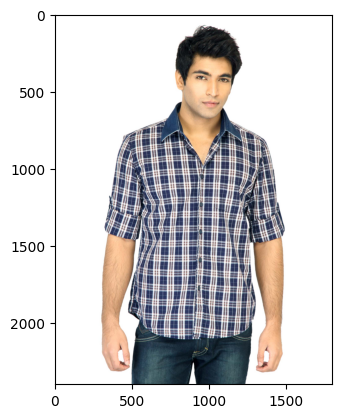

In [6]:
#read the image data file
im = cv2.imread(DATASET_PATH + "img_small/" + df['image'][0])
#chnage the color space to RGB
img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
plt.imshow(img)


## Helper Functions

### Plot Pie Grid 

In [8]:
#import KMeans and Counter
from sklearn.cluster import KMeans
from collections import Counter

def RGB2HEX(color):
    return "#{:02x}{:02x}{:02x}".format(int(color[0]), int(color[1]), int(color[2]))

def pull_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


def plot_color_pie_grid(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape((img.shape[0] * img.shape[1], 3))
    clt = KMeans(n_clusters =5)
    labels = clt.fit_predict(img)
    counts = Counter(labels)
    counts = dict(sorted(counts.items(), key=lambda x: x[1], reverse=True))
    color_centroid_colors = clt.cluster_centers_
    clustered_colors = [color_centroid_colors[i] for i in counts.keys()]
    hex_colors = [RGB2HEX(clustered_colors[i]) for i in counts.keys()]
    rgb_colors = [clustered_colors[i] for i in counts.keys()]
    plt.figure(figsize = (8, 6))
    plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)
    
    return plt.show()

### Histogram Grid

In [9]:
#plot histogram grid for all the images in nn
def extract_color_histograms(image_path, bins=(8, 8, 8)):
    #extract a 3D color histogram from the HSV color space using the supplied number of `bins` per channel
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        red_hist = cv2.calcHist([image], [0], None, [bins[0]], [0, 256])
        green_hist = cv2.calcHist([image], [1], None, [bins[1]], [0, 256])
        blue_hist = cv2.calcHist([image], [2], None, [bins[2]], [0, 256])
        
        #normalize the histograms
        red_hist = cv2.normalize(red_hist, red_hist).flatten()
        green_hist = cv2.normalize(green_hist, green_hist).flatten()
        blue_hist = cv2.normalize(blue_hist, blue_hist).flatten()

        #concatenate the histograms
        hist = cv2.calcHist([image], [0, 1, 2], None, bins,
                            [0, 256, 0, 256, 0, 256])
        hist = cv2.normalize(hist, hist).flatten()

        return red_hist, green_hist, blue_hist, hist




path = DATASET_PATH + "img_small/"
def histogram_grid(nn, path, loading_df):
    fig = plt.figure(figsize=(18,4))
    #create a grid of subplots
    columns = 5
    rows = 1
    #nn is a list of image names
    for i in range(1, columns*rows +1):
        img = cv2.imread(path + str(loading_df['index'][nn[i-1]]) + ".jpg")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        fig.add_subplot(rows, columns, i)
        #plot the histograms
        red_hist, green_hist, blue_hist, hist = extract_color_histograms(path + str(loading_df['index'][nn[i-1]]) + ".jpg")
        plt.plot(red_hist, color='r')
        plt.plot(green_hist, color='g')
        plt.plot(blue_hist, color='b')


### Compare RGB Histograms

In [10]:
def calculateHellingerDistance(query_image_path, images2_compare):
        #compute the hellinger distance between the query image and the images in images2_compare
        #extract the color histograms from the query image and the current image
        red_hist, green_hist, blue_hist, hist = extract_color_histograms(query_image_path)
        red_hist2, green_hist2, blue_hist2, hist2 = extract_color_histograms(images2_compare)
        #compute the hellinger distance beween hist and hist2
        hellinger_distance = cv2.compareHist(hist, hist2, cv2.HISTCMP_BHATTACHARYYA)
        return hellinger_distance

def computeHellingerDistance(query_image_path, images2_compare):
    hellinger_distance = []
    for i in range(len(images2_compare)):
        hellinger_distance.append(calculateHellingerDistance(query_image_path, images2_compare[i]))
    print(f"Mean: {np.mean(hellinger_distance)}")
    print(f"Standard Deviation: {np.std(hellinger_distance)}")
    return np.mean(hellinger_distance), np.std(hellinger_distance), hellinger_distance

## Extract Embeddings

In [11]:
## Extract Embeddings from the images

#load the model
model =VGG16(include_top=False,input_shape=(256,256,3))
model.summary()



#extract the features from the images
def extract_features(directory):
    features = {}
    for img in tqdm(os.listdir(directory)):
        filename = directory + '/' + img
        image = load_img(filename, target_size=(256, 256))
        image = img_to_array(image)
        image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
        image = image.astype('float32')
        image = image / 255.0
        feature = model.predict(image, verbose=0)
        image_id = img.split('.')[0]
        features[image_id] = feature
    return features


#extract the features from the images
features = extract_features(DATASET_PATH + "img_small")



2022-12-12 10:00:59.228218: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

100%|██████████| 1660/1660 [06:21<00:00,  4.35it/s]


In [12]:
type(features)
#save the features to a file
np.save(DATASET_PATH + "features.npy", features)

In [13]:
features['10186'].shape

(1, 8, 8, 512)

### Flatten Features

In [14]:
#flatten the features
def flatten_features(features):
    flat_features = {}
    for key, value in tqdm(features.items()):
        flat_features[key] = value.flatten()
    return flat_features

flat_features = flatten_features(features)

#save the features to a file
np.save(DATASET_PATH + "flat_features.npy", flat_features)

#load the features from the file
flat_features = np.load(DATASET_PATH + "flat_features.npy", allow_pickle=True).item()

100%|██████████| 1660/1660 [00:00<00:00, 24067.70it/s]


In [15]:
#index the flat features into fiass index
flat_features = {int(k):v for k,v in flat_features.items()}
flat_features = pd.DataFrame.from_dict(flat_features, orient='index')
flat_features.head(2)

,0,1,2,3,4,5,6,7,8,9,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
2672,0.087335,0.0,0.0,0.0,0.211688,0.0,0.0,0.0,0.0,0.0,...,1.879584,0.000000,0.208335,0.0,0.0,0.383094,0.0,0.0,0.664540,0.0
52648,0.085028,0.0,0.0,0.0,0.212058,0.0,0.0,0.0,0.0,0.0,...,1.845027,0.184032,0.296067,0.0,0.0,0.216276,0.0,0.0,0.629404,0.0


In [16]:
flat_features.reset_index(drop=False, inplace=True)
flat_features.head(2)

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
0,2672,0.087335,0.0,0.0,0.0,0.211688,0.0,0.0,0.0,0.0,...,1.879584,0.000000,0.208335,0.0,0.0,0.383094,0.0,0.0,0.664540,0.0
1,52648,0.085028,0.0,0.0,0.0,0.212058,0.0,0.0,0.0,0.0,...,1.845027,0.184032,0.296067,0.0,0.0,0.216276,0.0,0.0,0.629404,0.0


In [17]:
flat_features.query('index == 6779')

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
1489,6779,0.115233,0.0,0.0,0.0,0.183884,0.0,0.0,0.0,0.0,...,1.773841,0.131301,0.49239,0.0,0.0,0.342822,0.0,0.0,0.540246,0.0


### Indexing it Nearest Neighbor Search

In [18]:
#create FIASS index from the flat features dataframe
from annoy import AnnoyIndex
f = flat_features.shape[1]-1
t = AnnoyIndex(f, 'angular')
for i in tqdm(range(flat_features.shape[0])):
    v = flat_features.iloc[i][1:].values
    t.add_item(i, v)
t.build(10)
t.save(DATASET_PATH + 'fiass.ann')

#load the FIASS index
t = AnnoyIndex(f, 'angular')
t.load(DATASET_PATH + 'fiass.ann')

#search the index for the nearest neighbors

100%|██████████| 1660/1660 [00:43<00:00, 38.33it/s]


True

### Search and Query Index

6779.0 0.0001530046429252252
19696.0 0.3724696636199951
12191.0 0.37478968501091003
46393.0 0.3760201632976532
41605.0 0.3814336359500885
37734.0 0.3829306364059448
29773.0 0.3829602897167206
19690.0 0.3835989832878113
28808.0 0.3836206793785095
31142.0 0.38377049565315247
Nearest Neighbors:


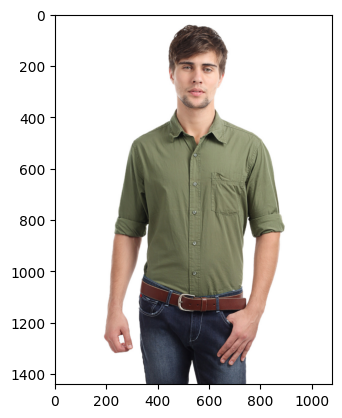

In [19]:
def search_index(index, image_id, n, df):
    image_id = int(image_id)
    nn = index.get_nns_by_item(image_id, n)

    #also return the distance for each of the nearest neighbors
    distances = []
    for idx in nn:
        print(df.iloc[idx]['index'], index.get_distance(image_id, idx))
        #store the distance in the list 
        distances.append(index.get_distance(image_id, idx))
    return nn, distances

#search the index for the nearest neighbors
def query_image(index, image_id, n=10):
    img = cv2.imread(DATASET_PATH + "img_small/" + str(flat_features['index'][query_index]) + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    nn = search_index(t, query_index, 10, flat_features)
    print("Nearest Neighbors:")
    return nn

#IMAGE at index 105
query_index=1489
nn, dist = query_image(t, query_index, 10)

In [20]:
dist

[0.0001530046429252252,
 0.3724696636199951,
 0.37478968501091003,
 0.3760201632976532,
 0.3814336359500885,
 0.3829306364059448,
 0.3829602897167206,
 0.3835989832878113,
 0.3836206793785095,
 0.38377049565315247]

### Loading Similar Images

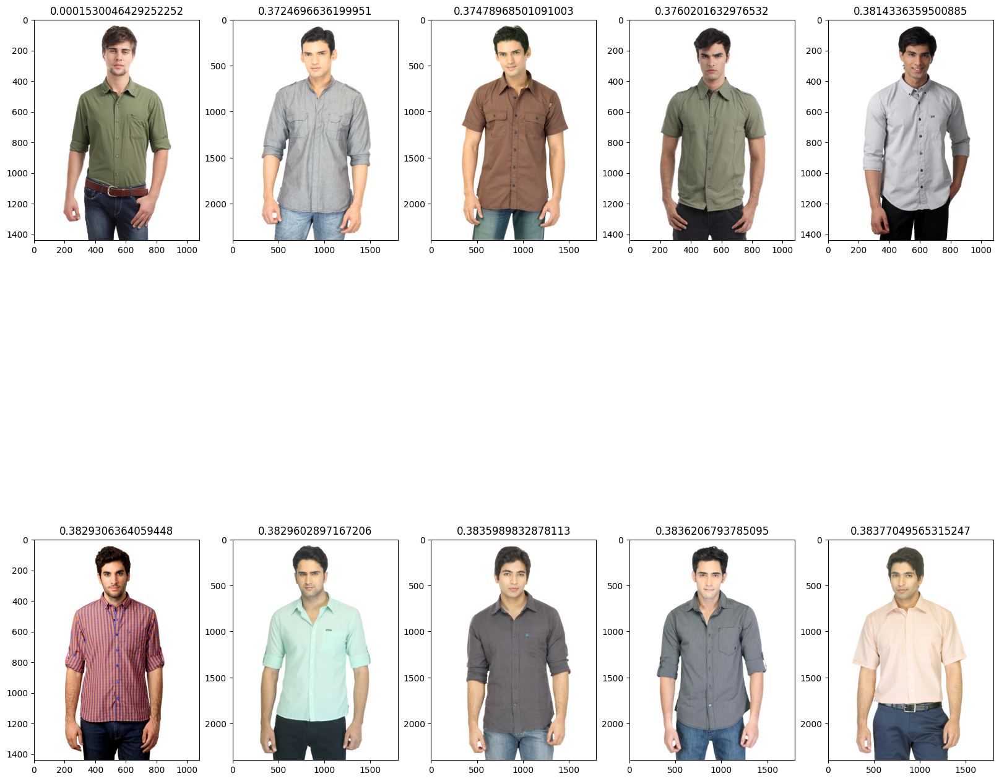

In [21]:
#load the closest images
def load_similar_images(nn, distance):
    #plot similar images and their distance
    fig = plt.figure(figsize=(20, 20))
    #create a grid of subplots
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        img = cv2.imread(DATASET_PATH + "img_small/" + str(flat_features['index'][nn[i-1]]) + ".jpg")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
        plt.title(distance[i-1])



load_similar_images(nn, dist)


In [23]:
def plot_color_pie_grid(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape((img.shape[0] * img.shape[1], 3))
    clt = KMeans(n_clusters =5)
    labels = clt.fit_predict(img)
    counts = Counter(labels)
    counts = dict(sorted(counts.items(), key=lambda x: x[1], reverse=True))
    color_centroid_colors = clt.cluster_centers_
    clustered_colors = [color_centroid_colors[i] for i in counts.keys()]
    hex_colors = [RGB2HEX(clustered_colors[i]) for i in counts.keys()]
    rgb_colors = [clustered_colors[i] for i in counts.keys()]
    #plt.figure(figsize = (8, 6))
    #plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)
    # return the image
    return counts, rgb_colors, hex_colors

In [24]:
nn

[1489, 1307, 539, 1237, 1655, 916, 221, 1538, 1214, 1041]

In [25]:
##plot color pie grid for the images in nn using plot_color_pie_grid function in one grid of 10 images
grid_path = DATASET_PATH + "img_small/" 

def pie_grid(nn, path, df):
    fig = plt.figure(figsize=(20, 20))
    #create a grid of subplots
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        img = cv2.imread(path + str(df['index'][nn[i-1]]) + ".jpg")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
        counts, rgb_colors, hex_colors = plot_color_pie_grid(path + str(df['index'][nn[i-1]]) + ".jpg")
        plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)
        plt.title(dist[i-1])


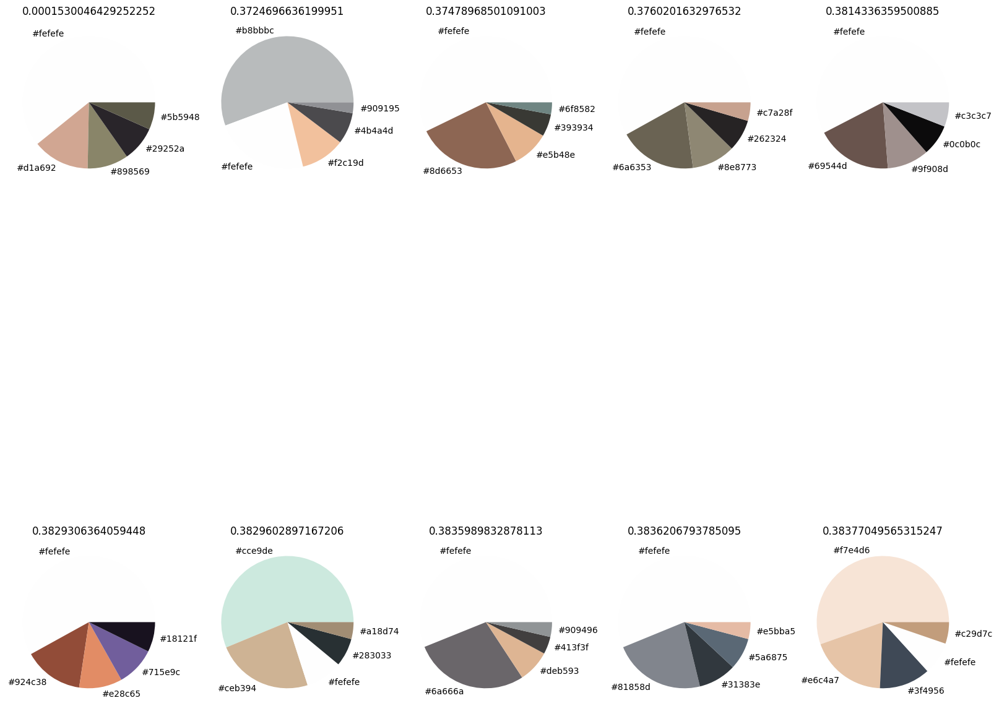

In [26]:
pie_grid(nn, grid_path, flat_features)

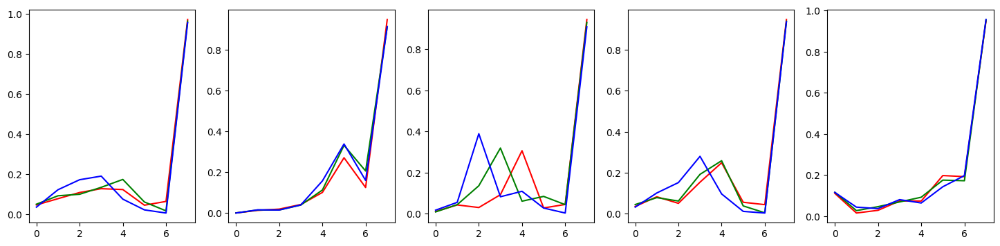

In [27]:
#histogrm grid

histogram_grid(nn, grid_path, flat_features)

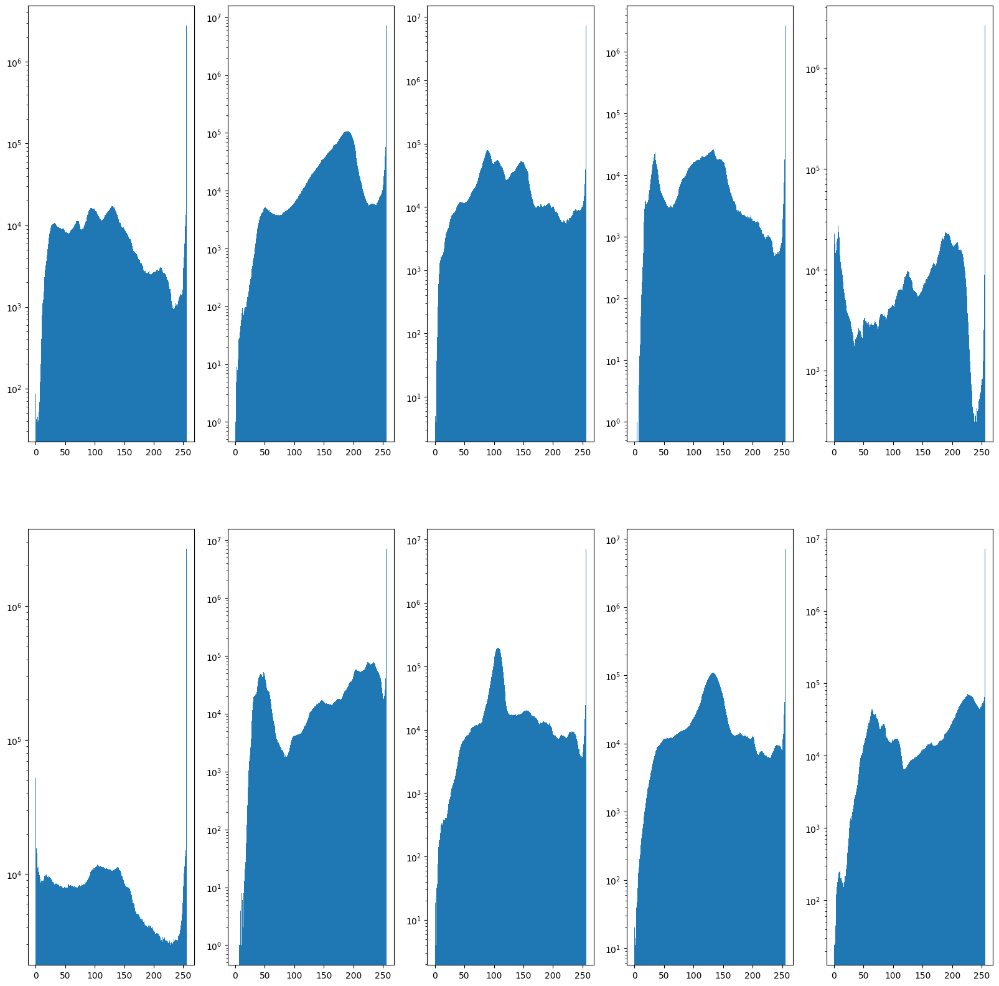

In [28]:
#exctract color histogram features from the images
def extract_color_features(nn):
    closest_image = flat_features.iloc[nn]['index']
    closest_images = []
    for i in closest_image:
        im = cv2.imread(DATASET_PATH + "img_small/" + str(i) + ".jpg")
        #chnage the color space to RGB
        img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        closest_images.append(img)
    #plot the closest images
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        plt.hist(closest_images[i-1].ravel(),256,[0,256], log=True)
    return plt.show()

#preview the closest images
extract_color_features(nn)


## Face Detection

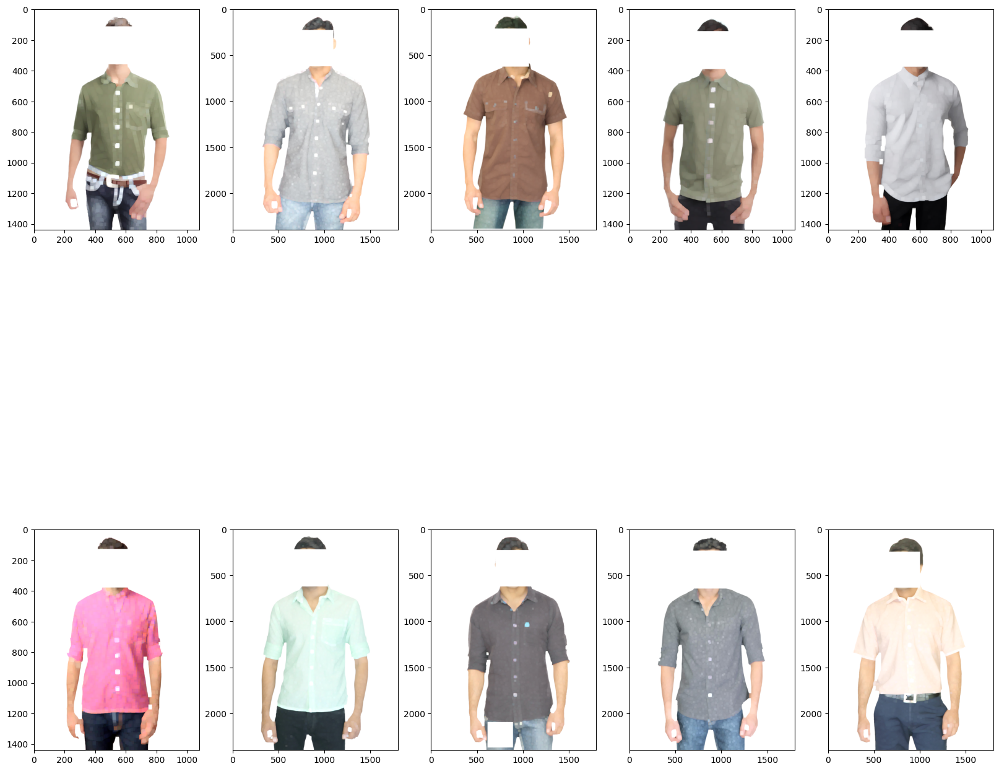

In [29]:
face_identifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')


#remove the faces from the images and replace with white background using haar cascade
def remove_faces_haar_cascade(img):

    gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_identifier.detectMultiScale(gray_image, 1.3, 5)
    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,255,255),-1)
    return img

#plot the images with faces removed
def plot_faces_removed(nn):
    closest_image = flat_features.iloc[nn]['index']
    closest_images = []
    for i in closest_image:
        im = cv2.imread(DATASET_PATH + "img_small/" + str(i) + ".jpg")
        #chnage the color space to RGB
        img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        closest_images.append(img)
    #plot the closest images
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        image = remove_faces_haar_cascade(closest_images[i-1])
        # dilate the image
        kernel = np.ones((5,5),np.uint8)
        image = cv2.dilate(image,kernel,iterations = 5)
        plt.imshow(image)
    return plt.show()


#preview the closest images
plot_faces_removed(nn)

### Remove Faces

In [30]:
#loop over all the images and remove the faces in DATASET_PATH + "img_small" and save them in DATASET_PATH + "img_small_no_faces"

def remove_faces_haar_cascade(DIRECTORY):
    
    for file in tqdm(os.listdir(DIRECTORY+ "img_small")):
        img = cv2.imread(DIRECTORY+ "img_small/" + file)
        gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_identifier.detectMultiScale(gray_image, 1.3, 5)
        for (x,y,w,h) in faces:
            cv2.rectangle(img,(x,y),(x+w,y+h),(255,255,255),-1)
        cv2.imwrite(DIRECTORY+ "img_small_no_faces/" + file, img)
    return print("Done")

#remove the faces from the images
remove_faces_haar_cascade(DATASET_PATH)


100%|██████████| 1660/1660 [04:53<00:00,  5.65it/s]

Done


### Creating Features with Removed Faces

In [31]:
#extract the features from the images with faces removed
features_with_faces_removed = extract_features(DATASET_PATH + "img_small_no_faces")

100%|██████████| 1660/1660 [07:14<00:00,  3.82it/s]


In [32]:
#save the features in .npy
np.save(DATASET_PATH + "features_with_faces_removed.npy", features_with_faces_removed)

#load the features
flat_features_faces_removed = flatten_features(features_with_faces_removed)

#save the features in .npy
np.save(DATASET_PATH + "flat_features_faces_removed.npy", flat_features_faces_removed)



100%|██████████| 1660/1660 [00:00<00:00, 13259.74it/s]


In [33]:
flatten_features_faces_removed  = {int(k): v for k, v in flat_features_faces_removed.items()}
flat_features_faces_removed_df = pd.DataFrame.from_dict(flatten_features_faces_removed, orient='index')


In [34]:
flat_features_faces_removed_df.reset_index(drop=False, inplace=True)

### Nearest Neighbor Search Index for features without Faces

In [35]:
#build the index
f_faces_removed = flat_features_faces_removed_df.shape[1]-1
t_faces_removed = AnnoyIndex(f_faces_removed, 'angular')
for i in tqdm(range(len(flat_features_faces_removed_df))):
    t_faces_removed.add_item(i, flat_features_faces_removed_df.iloc[i][1:].values)

#build the index
t_faces_removed.build(10)

#save the index
t_faces_removed.save(DATASET_PATH + "index_faces_removed.ann")

#load the index
t_faces_removed = AnnoyIndex(f_faces_removed, 'angular')
t_faces_removed.load(DATASET_PATH + "index_faces_removed.ann")



100%|██████████| 1660/1660 [01:03<00:00, 26.30it/s]


True

In [36]:
flat_features.head(2)

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
0,2672,0.087335,0.0,0.0,0.0,0.211688,0.0,0.0,0.0,0.0,...,1.879584,0.000000,0.208335,0.0,0.0,0.383094,0.0,0.0,0.664540,0.0
1,52648,0.085028,0.0,0.0,0.0,0.212058,0.0,0.0,0.0,0.0,...,1.845027,0.184032,0.296067,0.0,0.0,0.216276,0.0,0.0,0.629404,0.0


In [37]:
flat_features.query('index == 5988')

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
455,5988,0.125276,0.0,0.0,0.0,0.1608,0.0,0.0,0.0,0.0,...,1.703478,0.34147,0.495215,0.0,0.0,0.521351,0.0,0.0,0.544435,0.0


### Querying Index for Recommendation [Without Faces Index]

In [38]:
#IMAGE at index 105
query_index=1489


def query_image_faces_removed(index, image_id, n=10):
    img = cv2.imread(DATASET_PATH + "img_small_no_faces/" + str(flat_features['index'][query_index]) + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    nn, distances = search_index(t_faces_removed, query_index, 10, flat_features_faces_removed_df)
    return nn, distances

    



6779.0 0.00021134472626727074
13759.0 0.3761855363845825
13744.0 0.3812474012374878
31142.0 0.38230425119400024
29773.0 0.3828878402709961
37734.0 0.38301578164100647
29813.0 0.38725540041923523
8860.0 0.38879090547561646
12191.0 0.38918083906173706
13756.0 0.3893352746963501


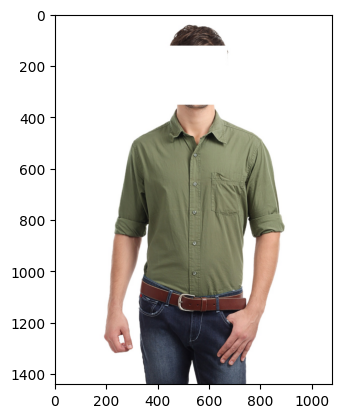

In [39]:
#preview the query image
nn_removed, distance_removed = query_image_faces_removed(t_faces_removed, query_index)

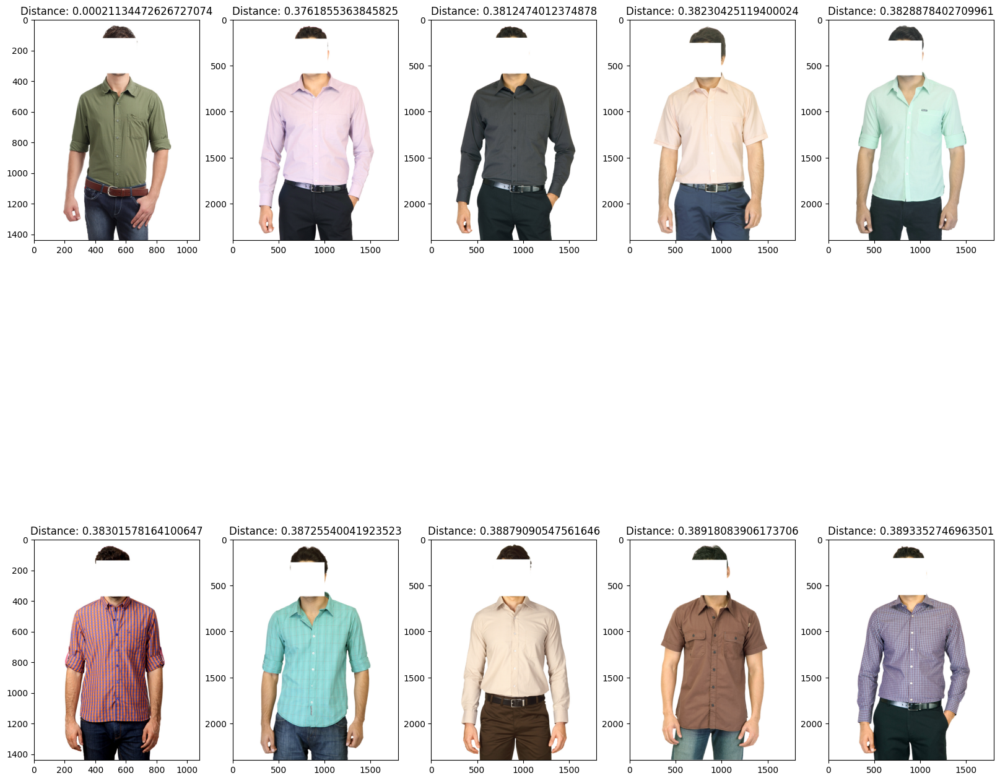

In [40]:
def load_similar_images_removed(nn, distance_removed):
    #plot closes images and their distances
    closest_image = flat_features_faces_removed_df.iloc[nn]['index']
    closest_images = []
    for i in closest_image:
        im = cv2.imread(DATASET_PATH + "img_small_no_faces/" + str(i) + ".jpg")
        #chnage the color space to RGB
        img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        closest_images.append(img)

    #plot the closest images
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(closest_images[i-1])
        plt.title("Distance: " + str(distance_removed[i-1]))
    return plt.show()

#preview the closest images
load_similar_images_removed(nn_removed, distance_removed)

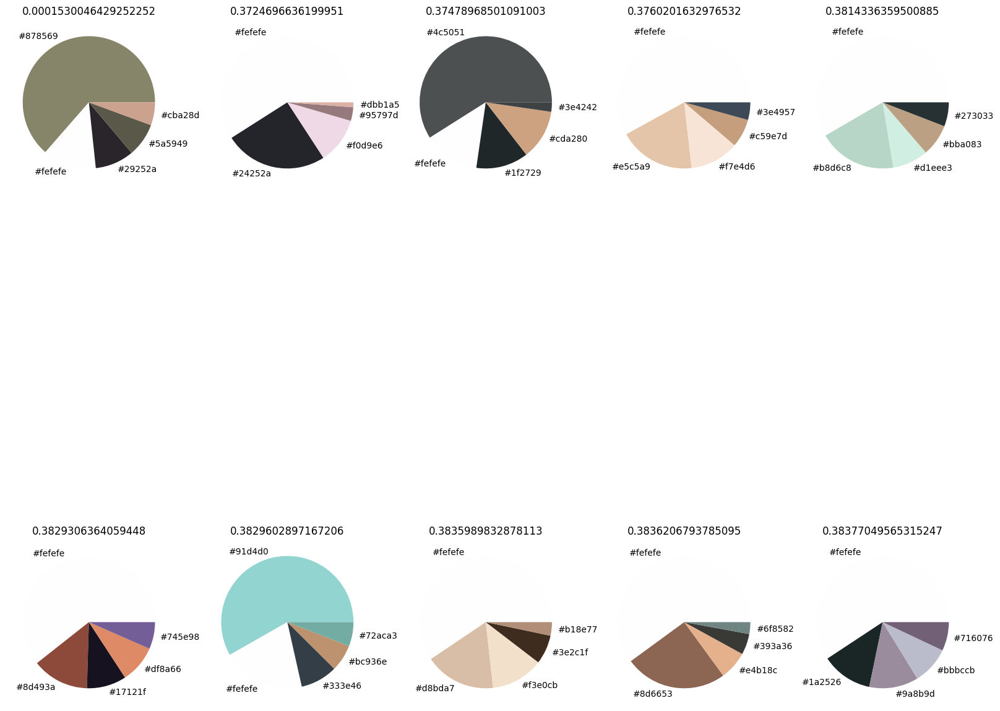

In [41]:
#pie grid
path = DATASET_PATH + "img_small_no_faces/"
pie_grid(nn_removed,path,  flat_features_faces_removed_df)

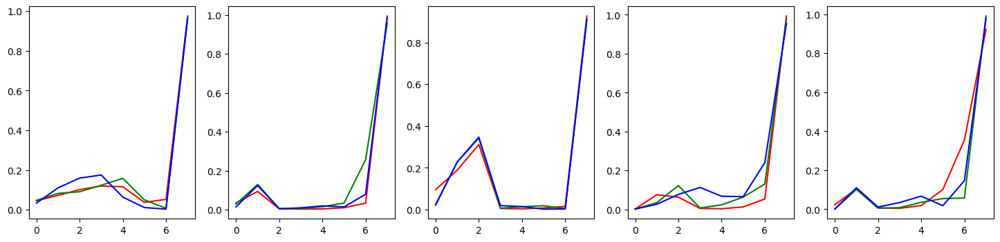

In [42]:
#histogram grid
path = DATASET_PATH + "img_small_no_faces/"
histogram_grid(nn_removed,path,  flat_features_faces_removed_df)

In [43]:
def load_similar_images_removed_original(nn, distance_removed):
    #plot closes images and their distances
    closest_image = flat_features_faces_removed_df.iloc[nn]['index']
    closest_images = []
    for i in closest_image:
        im = cv2.imread(DATASET_PATH + "img_small/" + str(i) + ".jpg")
        #chnage the color space to RGB
        img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        closest_images.append(img)

    #plot the closest images
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(closest_images[i-1])
        plt.title("Distance: " + str(distance_removed[i-1]))
    return plt.show()

##preview the closest images
#load_similar_images_removed_original(nn_removed, distance_removed)

## Features with Skin Face and Cropped

In [44]:
#extract the features from the images with faces removed and skin removed

features_with_faces_and_skin_removed = extract_features(DATASET_PATH + "img_small_no_faces_cropped")

##extract the features from the images with faces removed and skin removed
#extract_features_skin_removed = extract_features(DATASET_PATH + "img_small_no_faces_cropped")

#save the features in .npy
np.save(DATASET_PATH + "features_with_faces_and_skin_removed.npy", features_with_faces_and_skin_removed)


100%|██████████| 1094/1094 [03:35<00:00,  5.08it/s]


In [45]:
#load the features
flat_features_faces_and_skin_removed = flatten_features(features_with_faces_and_skin_removed)

#save the features in .npy
np.save(DATASET_PATH + "flat_features_faces_and_skin_removed.npy", flat_features_faces_and_skin_removed)

flatten_features_faces_and_skin_removed  = {int(k): v for k, v in flat_features_faces_and_skin_removed.items()}
flat_features_faces_and_skin_removed_df = pd.DataFrame.from_dict(flatten_features_faces_and_skin_removed, orient='index')


flat_features_faces_and_skin_removed_df.reset_index(drop=False, inplace=True)

100%|██████████| 1094/1094 [00:00<00:00, 31996.82it/s]


In [69]:
#IMAGE at index 105
query_index=135

def search_index(index, image_id, n, df):
    image_id = int(image_id)
    nn = index.get_nns_by_item(image_id, n)

    #also return the distance for each of the nearest neighbors
    distances = {}
    for idx in nn:
        print(df.iloc[idx]['index'], index.get_distance(image_id, idx))
        #store the distance in the list 
        #distances.append(index.get_distance(image_id, idx))
        distances[idx] = index.get_distance(image_id, idx)
    
    sorted_distances = dict(sorted(distances.items(), key=lambda item: item[1]))
    sorted_nn = list(sorted_distances.keys())
    sorted_distance = list(sorted_distances.values())
    return sorted_nn, sorted_distance

def query_image(index, query_index, lookup_path, lookup_DF , n=10):
    img = cv2.imread(lookup_path + str(lookup_DF['index'][query_index]) + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    nn = search_index(index, query_index, n, lookup_DF)
    print("Nearest Neighbors:")
    return nn



def fiass_index(flat_features, save_index_as):
    f = flat_features.shape[1]-1
    t = AnnoyIndex(f, 'angular')
    for i in tqdm(range(flat_features.shape[0])):
        v = flat_features.iloc[i][1:].values
        t.add_item(i, v)
    t.build(10)
    t.save(DATASET_PATH + save_index_as)
    return t

In [ ]:
#build the index

t_faces_and_skin_removed = fiass_index(flat_features_faces_and_skin_removed_df, "index_faces_and_skin_removed.ann")

6779.0 0.00022400901070795953
46393.0 0.32734158635139465
43488.0 0.3346322476863861
37727.0 0.33718666434288025
6331.0 0.3486473262310028
Nearest Neighbors:


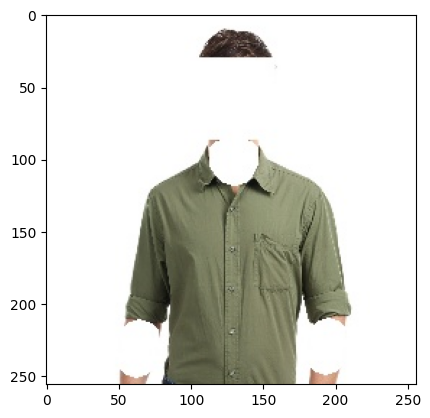

In [70]:
LOOKUP_PATH_FACES_CRPPED = DATASET_PATH + "img_small_no_faces_cropped/"
LOOKUP_DF_FACES_CRPPED = flat_features_faces_and_skin_removed_df

#query the image
query_index_face_removed = 984

#query the image
nn_faces_and_skin_removed, distance_faces_and_skin_removed = query_image(t_faces_and_skin_removed, query_index_face_removed, LOOKUP_PATH_FACES_CRPPED, LOOKUP_DF_FACES_CRPPED, n=5)


### Load Similar Images [Skin, Face, Cropped]

In [50]:
###Load Similar Images

def load_similar_images(nn, distance, loading_path, loading_df):
    #plot similar images and their distance
    fig = plt.figure(figsize=(20, 20))
    #create a grid of subplots
    columns = 5
    rows = 1
    for i in range(1, columns*rows +1):
        img = cv2.imread(loading_path + str(loading_df['index'][nn[i-1]]) + ".jpg")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
        #setting the title of the subplot with rounded distance
        plt.title(f"Distance: {round(distance[i-1], 4)}")
    plt.show()

In [51]:
flat_features_faces_and_skin_removed_df.head(2)


,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
0,2128,0.118086,0.0,0.0,0.0,0.205052,0.0,0.0,0.0,0.0,...,1.735186,0.005990,0.506561,0.0,0.0,0.274328,0.0,0.0,0.572673,0.0
1,40258,0.122878,0.0,0.0,0.0,0.205402,0.0,0.0,0.0,0.0,...,1.456664,0.500067,0.759474,0.0,0.0,0.298443,0.0,0.0,0.652236,0.0


In [52]:
flat_features_faces_and_skin_removed_df.query('index == 6779')


,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
984,6779,0.092799,0.0,0.0,0.0,0.213198,0.0,0.0,0.0,0.0,...,1.495362,0.845098,0.363771,0.0,0.0,0.201544,0.0,0.0,0.672803,0.0


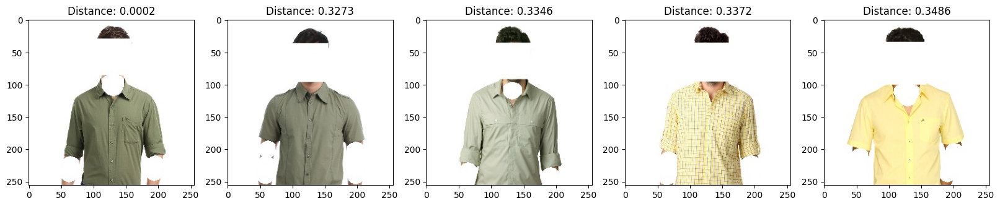

In [53]:
loakup_load_path_faces_and_skin_removed = DATASET_PATH + "img_small_no_faces_cropped/"
lookup_load_df_faces_and_skin_removed = flat_features_faces_and_skin_removed_df

#load the similar images
load_similar_images(nn_faces_and_skin_removed, distance_faces_and_skin_removed, loakup_load_path_faces_and_skin_removed, lookup_load_df_faces_and_skin_removed)

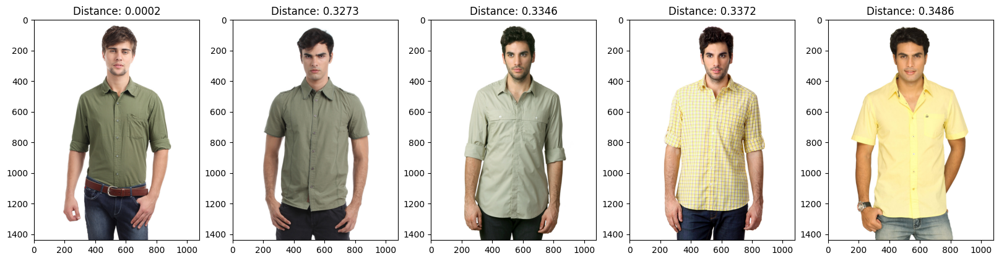

In [54]:
loakup_load_path_faces_and_skin_removed = DATASET_PATH + "img_small/"
lookup_load_df_faces_and_skin_removed = flat_features_faces_and_skin_removed_df

#load the similar images
load_similar_images(nn_faces_and_skin_removed, distance_faces_and_skin_removed, loakup_load_path_faces_and_skin_removed, lookup_load_df_faces_and_skin_removed)

In [55]:
nn_faces_and_skin_removed

[984, 819, 701, 797, 609]

In [56]:
flat_features_faces_and_skin_removed_df.iloc[nn_faces_and_skin_removed]

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
984,6779,0.092799,0.0,0.0,0.0,0.213198,0.0,0.0,0.0,0.0,...,1.495362,0.845098,0.363771,0.0,0.0,0.201544,0.0,0.0,0.672803,0.0
819,46393,0.104421,0.0,0.0,0.0,0.210648,0.0,0.0,0.0,0.0,...,1.478837,0.592487,0.619830,0.0,0.0,0.250483,0.0,0.0,0.706935,0.0
701,43488,0.093198,0.0,0.0,0.0,0.213701,0.0,0.0,0.0,0.0,...,1.688946,0.871388,0.177058,0.0,0.0,0.368359,0.0,0.0,0.662030,0.0
797,37727,0.093178,0.0,0.0,0.0,0.213386,0.0,0.0,0.0,0.0,...,1.739590,0.699503,0.323550,0.0,0.0,0.090431,0.0,0.0,0.619182,0.0
609,6331,0.125364,0.0,0.0,0.0,0.210596,0.0,0.0,0.0,0.0,...,1.595608,0.565605,0.431097,0.0,0.0,0.191233,0.0,0.0,0.676796,0.0


In [ ]:
path = DATASET_PATH + "img_small_no_faces_cropped/"
#pie_grid(nn_faces_and_skin_removed,  path, flat_features_faces_and_skin_removed_df)

In [58]:
type(nn_faces_and_skin_removed[0])

int

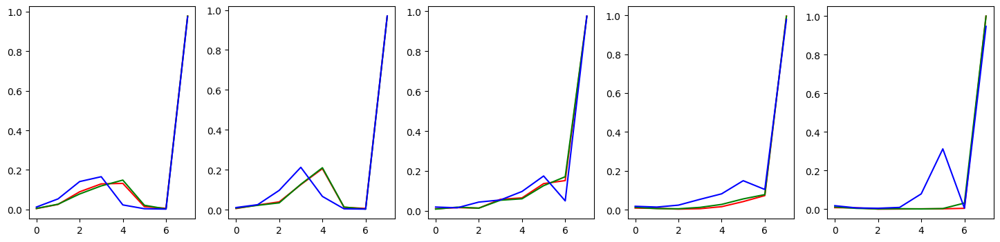

In [59]:
#histogram grid 
path = DATASET_PATH + "img_small_no_faces_cropped/"
histogram_grid(nn_faces_and_skin_removed,  path, flat_features_faces_and_skin_removed_df)


## Evaluation

### Query Image

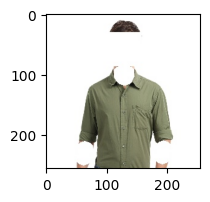

In [60]:
query_image_path = DATASET_PATH + "img_small_no_faces_cropped/" + str(flat_features_faces_and_skin_removed_df['index'][query_index_face_removed]) + ".jpg"
query_image = cv2.imread(query_image_path)
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
#plot a small image
plt.figure(figsize=(2,2))
plt.imshow(query_image) 

### Comparing Histograms with query Image and Top-5 raw images without pre-processing

In [61]:
images2compare_raw = [DATASET_PATH + "img_small/" + str(flat_features['index'][i]) + ".jpg" for i in nn]
computeHellingerDistance(query_image_path, images2compare_raw)

Mean: 0.449337238815534
Standard Deviation: 0.10456878098014123


(0.449337238815534,
 0.10456878098014123,
 [0.23421019183948502,
  0.5165961114298435,
  0.5040260560016944,
  0.25456905758870146,
  0.4879782294750797,
  0.5464447906025315,
  0.499396168063846,
  0.46177673226816535,
  0.496495071533835,
  0.4918799793521577])

### Comparing Histograms with query Image and Top-5 images  face removed

In [62]:
images2compare_only_face_removed = [DATASET_PATH + "img_small_no_faces/" + str(flat_features_faces_removed_df['index'][nn_faces_and_skin_removed[i]]) + ".jpg" for i in range(5)]
computeHellingerDistance(query_image_path, images2compare_only_face_removed)

Mean: 0.43787145955899953
Standard Deviation: 0.05205547122594016


(0.43787145955899953,
 0.05205547122594016,
 [0.4695442042571783,
  0.4256031680348135,
  0.4917788517290174,
  0.3428980162577236,
  0.4595330575162651])

### Comparing Histograms with query Image and Top-5 images cropped, face and skin removed

In [63]:
#compute the difference in histogram for the query image and the similar images

images2compare_cropped_faces_and_skin_removed = [DATASET_PATH + "img_small_no_faces_cropped/" + str(flat_features_faces_and_skin_removed_df['index'][i]) + ".jpg" for i in nn_faces_and_skin_removed]
computeHellingerDistance(query_image_path, images2compare_cropped_faces_and_skin_removed)

Mean: 0.2945098428614106
Standard Deviation: 0.19509055280866625


(0.2945098428614106,
 0.19509055280866625,
 [0.0,
  0.15626673579894398,
  0.3197029064068745,
  0.4787041556009824,
  0.5178754165002519])

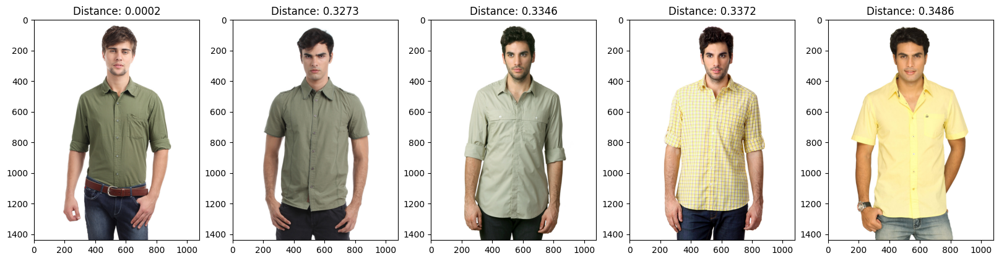

In [64]:
loakup_load_path_faces_and_skin_removed = DATASET_PATH + "img_small/"
lookup_load_df_faces_and_skin_removed = flat_features_faces_and_skin_removed_df

#load the similar images
load_similar_images(nn_faces_and_skin_removed, distance_faces_and_skin_removed, loakup_load_path_faces_and_skin_removed, lookup_load_df_faces_and_skin_removed)

### Load Similar Images to skin removed, cropped, and face removed images

In [72]:
#IMAGE at index 105
query_index=135

def search_index(index, image_id, n, df):
    image_id = int(image_id)
    nn = index.get_nns_by_item(image_id, n)

    #also return the distance for each of the nearest neighbors
    distances = {}
    for idx in nn:
        print(df.iloc[idx]['index'], index.get_distance(image_id, idx))
        #store the distance in the list 
        #distances.append(index.get_distance(image_id, idx))
        distances[idx] = index.get_distance(image_id, idx)
    
    sorted_distances = dict(sorted(distances.items(), key=lambda item: item[1]))
    sorted_nn = list(sorted_distances.keys())
    sorted_distance = list(sorted_distances.values())
    return sorted_nn, sorted_distance

def query_image(index, query_index, lookup_path, lookup_DF , n=10):
    img = cv2.imread(lookup_path + str(lookup_DF['index'][query_index]) + ".jpg")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    nn = search_index(index, query_index, n, lookup_DF)
    print("Nearest Neighbors:")
    return nn



def fiass_index(flat_features, save_index_as):
    f = flat_features.shape[1]-1
    t = AnnoyIndex(f, 'angular')
    for i in tqdm(range(flat_features.shape[0])):
        v = flat_features.iloc[i][1:].values
        t.add_item(i, v)
    t.build(10)
    t.save(DATASET_PATH + save_index_as)
    return t

6779.0 0.00022400901070795953
46393.0 0.32734158635139465
43488.0 0.3346322476863861
37727.0 0.33718666434288025
6331.0 0.3486473262310028
Nearest Neighbors:


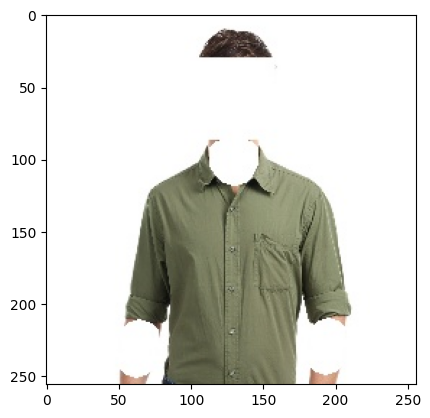

In [73]:
LOOKUP_PATH_FACES_CRPPED = DATASET_PATH + "img_small_no_faces_cropped/"
LOOKUP_DF_FACES_CRPPED = flat_features_faces_and_skin_removed_df

#query the image
query_index_face_removed = 984

#query the image
nn_faces_and_skin_removed, distance_faces_and_skin_removed = query_image(t_faces_and_skin_removed, query_index_face_removed, LOOKUP_PATH_FACES_CRPPED, LOOKUP_DF_FACES_CRPPED, n=5)


6779.0 0.00022400901070795953
46393.0 0.32734158635139465
43488.0 0.3346322476863861
37727.0 0.33718666434288025
6331.0 0.3486473262310028
48374.0 0.35150837898254395
26812.0 0.35881268978118896
41587.0 0.3646697402000427
41588.0 0.36518344283103943
22208.0 0.36946403980255127
37734.0 0.3705798387527466
19690.0 0.3714926838874817
19696.0 0.373449444770813
41592.0 0.3742233216762543
29841.0 0.3796314001083374
43481.0 0.38142701983451843
41605.0 0.38147446513175964
56769.0 0.38179728388786316
54979.0 0.38205793499946594
9752.0 0.38286569714546204
41589.0 0.3834363520145416
12016.0 0.38372302055358887
51406.0 0.38461756706237793
23959.0 0.3861751854419708
18973.0 0.3865596055984497
26815.0 0.38765957951545715
37728.0 0.38870254158973694
33787.0 0.38938188552856445
27562.0 0.38953056931495667
26800.0 0.3901634216308594
22207.0 0.39029359817504883
20189.0 0.3906627893447876
29831.0 0.39277201890945435
23957.0 0.39381423592567444
19721.0 0.3946308493614197
8860.0 0.39568886160850525
51409.0 

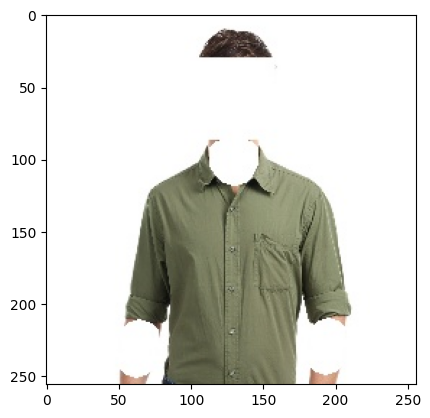

In [74]:
#put the images in nn in a list
#query the images
LOOKUP_PATH_FACES_CRPPED = DATASET_PATH + "img_small_no_faces_cropped/"
LOOKUP_DF_FACES_CRPPED = flat_features_faces_and_skin_removed_df

#query the image
query_index_face_removed = 984

#query the image
nn_faces_and_skin_removed, distance_faces_and_skin_removed = query_image(t_faces_and_skin_removed, query_index_face_removed, LOOKUP_PATH_FACES_CRPPED, LOOKUP_DF_FACES_CRPPED, n=50)
closest_image = flat_features_faces_and_skin_removed_df.iloc[nn_faces_and_skin_removed]['index']
closest_images = []
for i in closest_image:
    im = cv2.imread(DATASET_PATH + "img_small_no_faces_cropped/" + str(i) + ".jpg")
    #chnage the color space to RGB
    img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    closest_images.append(img)


In [75]:
#load 10 closest images
def load_similar_images_removed(nn, distance_removed):
    #plot closes images and their distances
    closest_image = flat_features_faces_and_skin_removed_df.iloc[nn]['index']
    closest_images = []
    for i in closest_image:
        im = cv2.imread(DATASET_PATH + "img_small_no_faces_cropped/" + str(i) + ".jpg")
        #chnage the color space to RGB
        img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        closest_images.append(img)

    #plot the closest images
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 2
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(closest_images[i-1])
        plt.title("Distance: " + str(distance_removed[i-1]))
    return plt.show()

## Filtering Images Based on Color

In [79]:
#Only Shirt features with faces removed
flat_features_faces_removed_df.head(2)

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
0,2672,0.087339,0.0,0.0,0.0,0.211713,0.0,0.0,0.0,0.0,...,1.888586,0.000000,0.215365,0.0,0.0,0.377130,0.0,0.0,0.670053,0.0
1,52648,0.085028,0.0,0.0,0.0,0.212054,0.0,0.0,0.0,0.0,...,1.844705,0.183604,0.296113,0.0,0.0,0.216459,0.0,0.0,0.629206,0.0


In [80]:
df.head(2)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,image
0,15970,Men,Apparel,Topwear,shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt,15970.jpg
1,39386,Men,Apparel,Bottomwear,jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans,39386.jpg


In [81]:
shirt_df = df[df['articleType'] == 'shirts'].reset_index(drop=True)
shirt_df.head(2)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,image
0,15970,Men,Apparel,Topwear,shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt,15970.jpg
1,30805,Men,Apparel,Topwear,shirts,Green,Summer,2012,Ethnic,Fabindia Men Striped Green Shirt,30805.jpg


In [82]:
#merge the features with the original dataframe
shirt_df = shirt_df.merge(flat_features_faces_removed_df, left_on='id', right_on='index', how='inner')
shirt_df.head(2)

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
0,15970,Men,Apparel,Topwear,shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt,...,1.735681,0.691441,0.080038,0.0,0.0,0.287941,0.0,0.0,0.636430,0.0
1,30805,Men,Apparel,Topwear,shirts,Green,Summer,2012,Ethnic,Fabindia Men Striped Green Shirt,...,1.703792,1.215204,0.194595,0.0,0.0,0.320461,0.0,0.0,0.681083,0.0


In [83]:
shirt_df.shape

(1094, 32780)

In [84]:
def RGB2HEX(color):
    return "#{:02x}{:02x}{:02x}".format(int(color[0]), int(color[1]), int(color[2]))

def pull_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


In [85]:
def HEX2RGB(color):
    color = color.lstrip('#')
    lv = len(color)
    return tuple(int(color[i:i + lv // 3], 16) for i in range(0, lv, lv // 3))

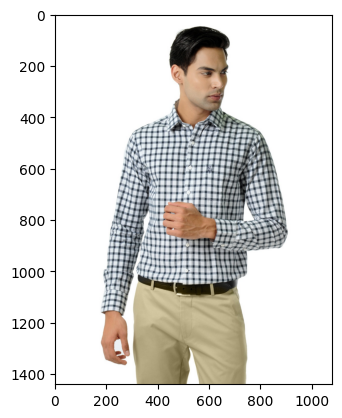

In [86]:
#shirt path 
shirt_path = DATASET_PATH + "img_small_no_faces/" + str(shirt_df['id'][10]) + ".jpg"

#plot the shirt
plt.imshow(pull_image(shirt_path))

100%|██████████| 1094/1094 [00:48<00:00, 22.73it/s]


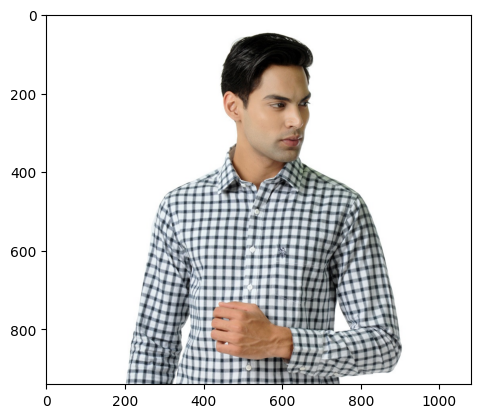

In [87]:
#crop the shirt
shirt = pull_image(shirt_path)

#crop the shirt by bottom 200 pixels
shirt = shirt[0:shirt.shape[0]-500, 0:shirt.shape[1]]

#plot the cropped shirt
plt.imshow(shirt)

#crop all the shits by bottom 400 pixels in height and resize it to 256 x 256 and save it in a new folder
for i in tqdm(range(len(shirt_df))):
    img = cv2.imread(DATASET_PATH + "img_small_no_faces/" + str(shirt_df['id'][i]) + ".jpg")
    img = img[0:img.shape[0]-400, 0:img.shape[1]]
    img = cv2.resize(img, (256, 256))

    #convert skin color to white HSV threshing
    # Defining the HSV threshs representing the HSV pixel intensities to be considered skin
    LOWER_thresh = np.array([0, 48, 80], dtype = "uint8")
    UPPER_thresh = np.array([20, 255, 255], dtype = "uint8")
    
    # Converting the image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Creating a binary mask with where
    # pixels in the HSV image fall into the upper or lower thresh
    mask = cv2.inRange(hsv, LOWER_thresh, UPPER_thresh)

    # Performing morphological operations to
    # remove noise from the thresh mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
    mask = cv2.erode(mask, kernel, iterations=2)
    mask = cv2.dilate(mask, kernel, iterations=2)

    # Blurring the image using a Gaussian filter
    mask = cv2.GaussianBlur(mask, (3, 3), 0)

    #convert the mask area to white in the original image
    img[mask > 0] = (255, 255, 255)

    
    

    #save the image
    cv2.imwrite(DATASET_PATH + "img_small_no_faces_cropped/" + str(shirt_df['id'][i]) + ".jpg", img)

    





## Color Based Recommendation

In [88]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
import cv2
from collections import Counter
from skimage.color import rgb2lab, deltaE_cie76,  deltaE_ciede2000, deltaE_cmc
import os


In [89]:
#extract the color of the cropped shirt using KMeans


def extract_color(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape((img.shape[0] * img.shape[1], 3)) 
    clt = KMeans(n_clusters = 5)
    clt.fit(img)
    return clt.cluster_centers_

#extract the color of the cropped shirt
extract_color(shirt_path)

array([[199.40665256, 205.07424436, 208.7812572 ],
       [253.70340361, 254.03043638, 254.20402183],
       [ 38.05422001,  39.0276771 ,  38.29850338],
       [175.37416725, 163.91124695, 143.51939757],
       [119.54811556, 113.64922397, 105.32152695]])

In [90]:
flat_features_faces_removed_df.query('index == 5988')

,index,0,1,2,3,4,5,6,7,8,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
455,5988,0.126672,0.0,0.0,0.0,0.177487,0.0,0.0,0.0,0.0,...,1.703376,0.340228,0.494718,0.0,0.0,0.521172,0.0,0.0,0.544442,0.0


In [91]:
shirt_df.query('id == 5988')

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,...,32758,32759,32760,32761,32762,32763,32764,32765,32766,32767
627,5988,Men,Apparel,Topwear,shirts,Pink,Summer,2011,Casual,Locomotive Men Pink Checked Shirt,...,1.703376,0.340228,0.494718,0.0,0.0,0.521172,0.0,0.0,0.544442,0.0


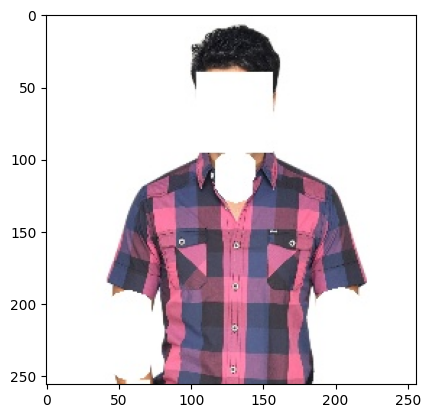

In [92]:
#shirt path 
query_image_color=627
shirt_path_cropped = DATASET_PATH + "img_small_no_faces_cropped/" + str(shirt_df['id'][query_image_color]) + ".jpg"
#query_image_color=455
#path_cropped_all = DATASET_PATH + "img_small/" + str(flat_features_faces_removed_df['index'][query_image_color]) + ".jpg"

#plot the shirt
#plt.imshow(pull_image(path_cropped_all))
plt.imshow(pull_image(shirt_path_cropped))

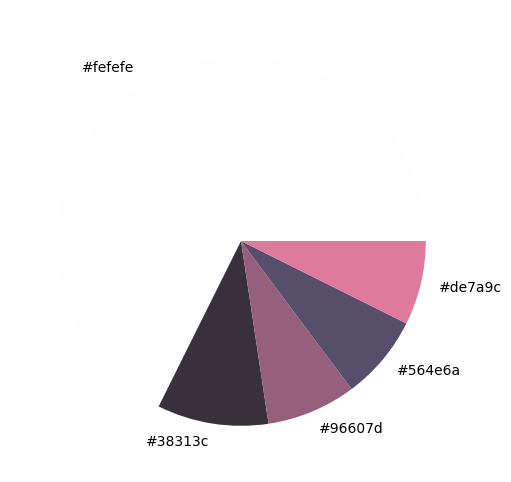

[array([254.77094846, 254.66049397, 254.61220255]),
 array([56.9398418 , 49.32410491, 60.30099917]),
 array([150.79408138,  96.12186601, 125.33066173]),
 array([ 86.91742258,  78.72489834, 106.64466688]),
 array([222.18162352, 122.625073  , 156.64045163])]

In [93]:
#extract the top 5 colors of the cropped shirt by count and plot it
def plot_color_pie(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape((img.shape[0] * img.shape[1], 3))
    clt = KMeans(n_clusters =5)
    labels = clt.fit_predict(img)
    counts = Counter(labels)
    counts = dict(sorted(counts.items(), key=lambda x: x[1], reverse=True))
    color_centroid_colors = clt.cluster_centers_
    clustered_colors = [color_centroid_colors[i] for i in counts.keys()]
    hex_colors = [RGB2HEX(clustered_colors[i]) for i in counts.keys()]
    rgb_colors = [clustered_colors[i] for i in counts.keys()]
    plt.figure(figsize = (8, 6))
    plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)
    plt.show()

    return rgb_colors


#plot the top 5 colors of the cropped shirt
shirt_path_cropped = DATASET_PATH + "img_small_no_faces_cropped/" + str(shirt_df['id'][query_image_color]) + ".jpg"
#path_cropped_all = DATASET_PATH + "img_small/" + str(flat_features_faces_removed_df['index'][query_image_color]) + ".jpg"
cluster_centers = extract_color(shirt_path_cropped)
plot_color_pie(shirt_path_cropped)
#cluster_centers = extract_color(path_cropped_all)
#plot_color_pie(path_cropped_all)


In [94]:
GREEN_IMG = HEX2RGB("#de7a9c")
GREEN_IMG

(222, 122, 156)

In [95]:
IMAGE_DIRECTORY = DATASET_PATH + "img_small_no_faces_cropped/"
COLORS = {
    'GREEN': [0, 128, 0],
    'BLUE': [0, 0, 128],
    'YELLOW': [255, 255, 0],
    'GREEN_IMG': [53, 61, 50],
    'DARK_RED': [208, 85, 101],
    'PINK': [222, 122, 156],
}
images = []

for file in os.listdir(IMAGE_DIRECTORY):
    if not file.startswith('.'):
        images.append(pull_image(os.path.join(IMAGE_DIRECTORY, file)))

In [96]:
IMAGE_DIRECTORY_RAW = DATASET_PATH + "img_small/"
images_raw = []

for file in os.listdir(IMAGE_DIRECTORY_RAW):
    if not file.startswith('.'):
        images_raw.append(pull_image(os.path.join(IMAGE_DIRECTORY_RAW, file)))


In [97]:
def plot_color(img):
    img = img.reshape((img.shape[0] * img.shape[1], 3))
    clt = KMeans(n_clusters =4)
    labels = clt.fit_predict(img)
    counts = Counter(labels)
    counts = dict(sorted(counts.items(), key=lambda x: x[1], reverse=True))
    color_centroid_colors = clt.cluster_centers_
    clustered_colors = [color_centroid_colors[i] for i in counts.keys()]
    hex_colors = [RGB2HEX(clustered_colors[i]) for i in counts.keys()]
    rgb_colors = [clustered_colors[i] for i in counts.keys()]
    #plt.figure(figsize = (8, 6))
    #plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)
    #plt.show()

    return rgb_colors


def match_colors(image, color, thresh = 60, number_of_colors = 5): 
    
    image_colors = plot_color(image)
    #filter if all the values are above 253
    image_colors = [x for x in image_colors if x[0] < 253 and x[1] < 253 and x[2] < 253]
    #print(f'Image COLORS: {image_colors}')
    selected_color = rgb2lab(np.uint8(np.asarray([[color]]))) #convert the color to lab
    number_of_colors = min(number_of_colors, len(image_colors)) #select the number of colors to compare
    select_image = False
    for i in range(number_of_colors):
        curr_color = rgb2lab(np.uint8(np.asarray([[image_colors[i]]])))
        diff = deltaE_cie76(selected_color, curr_color)
        #diff= deltaE_ciede2000(selected_color, curr_color)
        #diff = deltaE_cmc(selected_color, curr_color)
        if (diff < thresh):
            select_image = True
        
    
    return select_image

#select the shirt with green color



In [98]:
def display_filtered_image(images, color, thresh, colors_to_match):
    index = 1
    for i in range(len(images)):
        selected = match_colors(images[i],color,thresh,colors_to_match)
        if (selected) and index <= 5:
            print(f'Image { i }')
            plt.subplot(1, 5, index)
            plt.imshow(images[i])
            index += 1
    plt.show()


### Color Based Recommendation

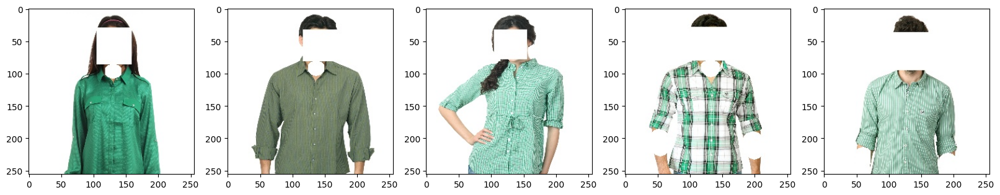

In [54]:
plt.figure(figsize = (20, 10))
display_filtered_image(images, COLORS['GREEN'], 60, 3)

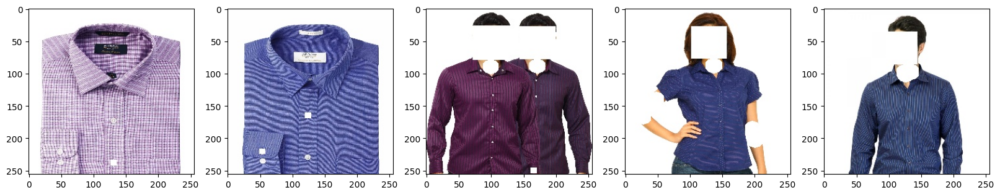

In [55]:
plt.figure(figsize = (20, 10))
display_filtered_image(images, COLORS['BLUE'], 60, 3)

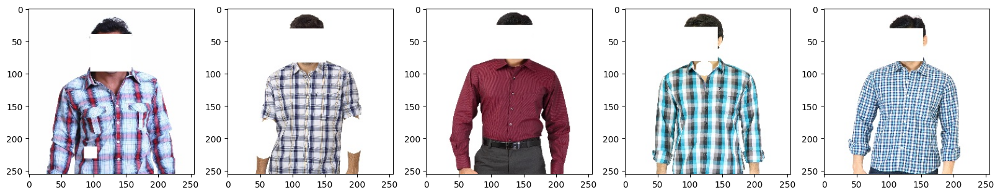

In [117]:
plt.figure(figsize = (20, 10))
display_filtered_image(images, COLORS['YELLOW'], 60, 3)

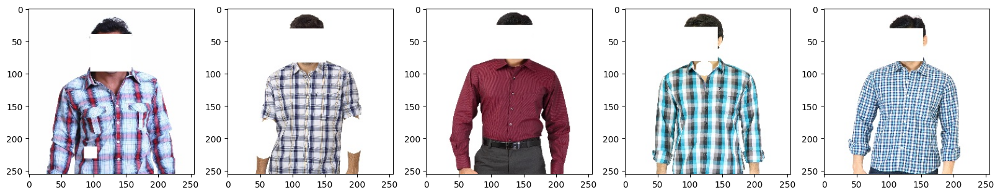

In [57]:
plt.figure(figsize = (20, 10))
display_filtered_image(images, COLORS['GREEN_IMG'], 60, 3)

## Recommend Images From Funnel Approach

Image 0
Image 4
Image 7
Image 26
Image 41


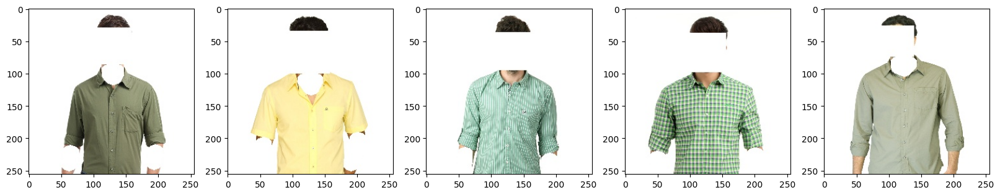

In [288]:
plt.figure(figsize = (20, 10))
display_filtered_image(closest_images, COLORS['GREEN'], 60, 3)

In [100]:
closest_image_index = [0,4,7,26,41]
nn_funnel_approach = closest_image.iloc[closest_image_index].to_list()

In [101]:
type(nn_funnel_approach)

#find index of the image in nn_funnel_approach from flat_features_faces_and_skin_removed_df
nn_funnel_approach_index = []
for i in range(len(nn_funnel_approach)):
    nn_funnel_approach_index.append(flat_features_faces_and_skin_removed_df.index[flat_features_faces_and_skin_removed_df['index'] == nn_funnel_approach[i]].tolist()[0])

nn_funnel_approach_index

[984, 609, 163, 411, 686]

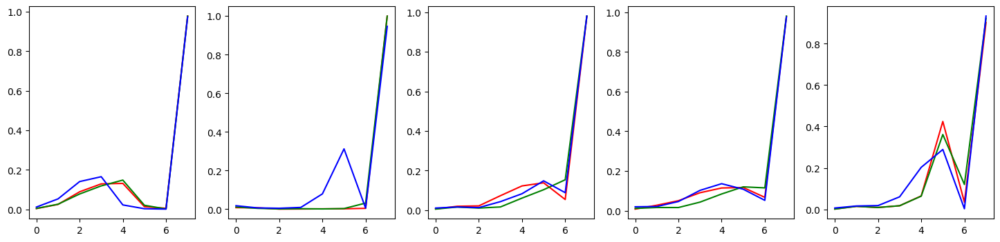

In [102]:
path = DATASET_PATH + "img_small_no_faces_cropped/"
histogram_grid(nn_funnel_approach_index,  path, flat_features_faces_and_skin_removed_df)

In [ ]:
#pie_grid(nn_funnel_approach_index,  path, flat_features_faces_and_skin_removed_df)

In [103]:
##compute hellinger distance
images2compare_funnel = [DATASET_PATH + "img_small_no_faces_cropped/" + str(flat_features_faces_and_skin_removed_df['index'][i]) + ".jpg" for i in nn_funnel_approach_index]
computeHellingerDistance(query_image_path, images2compare_funnel)

Mean: 0.35324226586705504
Standard Deviation: 0.18167690172500364


(0.35324226586705504,
 0.18167690172500364,
 [0.0,
  0.5178754165002519,
  0.4453679331345853,
  0.4033066231726183,
  0.3996613565278197])

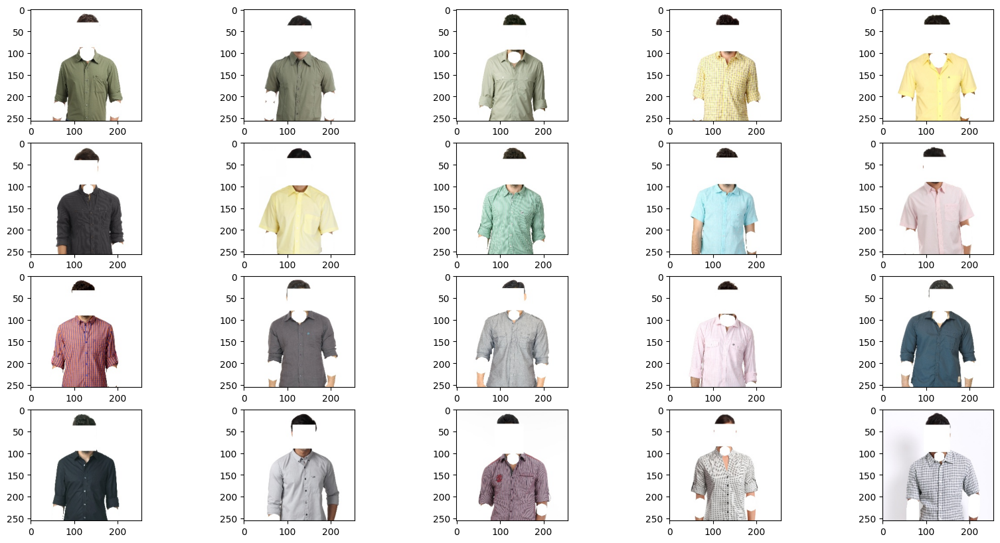

In [104]:
#Plot 20 images from closest_images
plt.figure(figsize = (20, 10))
for i in range(20):
    plt.subplot(4, 5, i+1)
    plt.imshow(closest_images[i])
plt.show()
